In [1]:
from process_tool import *
import boto3
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px
import plotly.graph_objects as go

In [2]:
s3 = boto3.resource('s3')
bucket_name = 'apacdlcdc-rms-ted-sample/lifecycle'

In [3]:
file_key = 'LVYPDBMDXMP201289/LVYPDBMDXMP201289_merged.csv'

In [3]:
def generate_group_df(file_key):
    split_data = process_s3_csv(file_key)
    parking_charge_data = charging_voltage_plot(split_data)
    filted_charging = filter_charging_event_2(parking_charge_data)
    group_df = charging_group_info(filted_charging)
    group_df_filtered= exclude_soh_outlier(group_df)
    return group_df_filtered

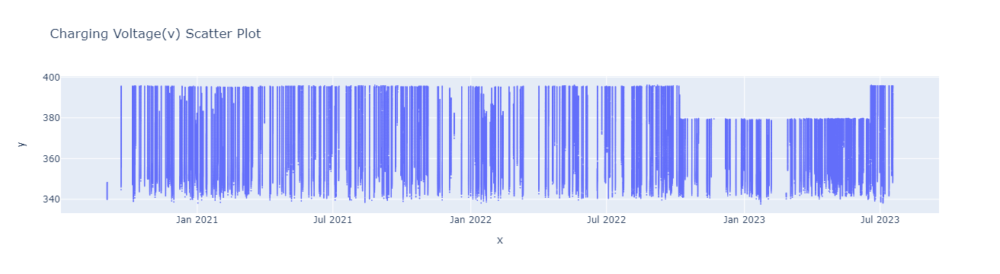

In [5]:
group_df_try = generate_group_df(file_key)

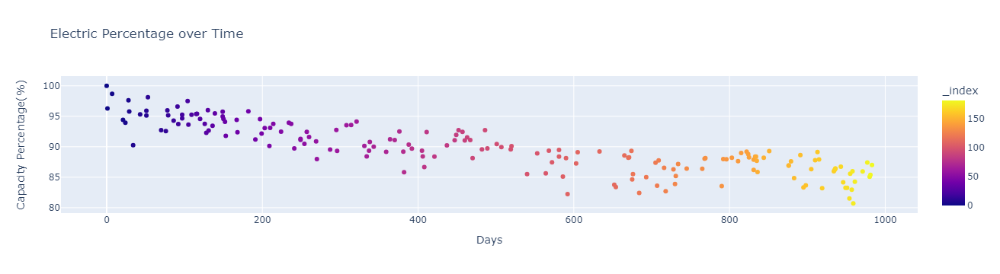

In [8]:
px.scatter(group_df_try,x='Days',y='Capacity Percentage(%)',
           color = group_df_try.index,
           title = 'Electric Percentage over Time')

In [ ]:
file_key_list = [**********]

group_df = []
for file_key in file_key_list:
    group_filtered = generate_group_df(file_key)
    fig = px.scatter(group_filtered, 
               x='Days', 
               y='Capacity Percentage(%)',
               color=group_filtered.index,
               title=f'Electric Charge of {file_key} over Time')
    fig.show()
    group_df.append(group_filtered)

In [5]:
from sklearn.linear_model import LinearRegression
import plotly.graph_objects as go

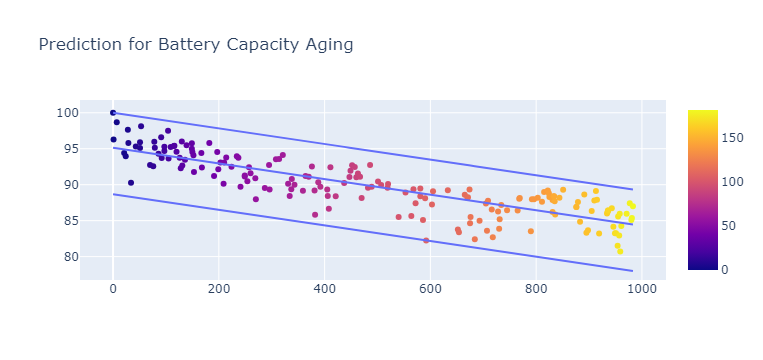

In [6]:
df_58599 = group_df[1]

X = df_58599['Days'].values.reshape(-1, 1)
y = df_58599['Capacity Percentage(%)'].values.reshape(-1, 1)

model = LinearRegression()
model.fit(X, y)
slope = model.coef_[0]
intercept = model.intercept_

residuals = y - model.predict(X)

index_residual_max = np.argmax(residuals)
index_residual_min = np.argmin(residuals)

pred = slope * df_58599['Days'].values + intercept
low = slope * df_58599['Days'].values - df_58599.iloc[index_residual_min]['Days']*slope + df_58599.iloc[index_residual_min]['Capacity Percentage(%)']
high = slope * df_58599['Days'].values - df_58599.iloc[index_residual_max]['Days']*slope + df_58599.iloc[index_residual_max]['Capacity Percentage(%)']

fig1 = px.scatter(x=df_58599['Days'], y=df_58599['Capacity Percentage(%)'],color =df_58599.index )
fig2 = px.line(x=df_58599['Days'], y=high)
fig3 = px.line(x=df_58599['Days'], y=pred)
fig4 = px.line(x=df_58599['Days'], y=low)

fig5 = go.Figure(data=fig1.data + fig2.data + fig3.data + fig4.data)
fig5.update_layout(
    title='Prediction for Battery Capacity Aging'
)
fig5.show()

In [7]:
def calculate_three_prediction(df):
    X = df['Days'].values.reshape(-1, 1)
    y = df['Capacity Percentage(%)'].values.reshape(-1, 1)
    model = LinearRegression()
    model.fit(X, y)
    # get slope and intercept from linear regression
    slope = model.coef_[0]
    intercept = model.intercept_
    residuals = y - model.predict(X)
    # find lowest and highest record above/below the regression line
    index_high = np.argmax(residuals)
    index_low = np.argmin(residuals)
    pred = slope * df['Days'].values + intercept
    low = slope * df['Days'].values - df.iloc[index_low]['Days']*slope + df.iloc[index_low]['Capacity Percentage(%)']
    high = slope * df['Days'].values - df.iloc[index_high]['Days']*slope + df.iloc[index_high]['Capacity Percentage(%)']
    return high, pred, low

In [8]:
def plot_three_lines_NEW(df, high, pred, low, vin):
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=df['Days'],
                             y=df['Capacity Percentage(%)'],
                             mode='lines+markers',
                             name='SOH data points'))
    fig.add_trace(go.Scatter(x=df['Days'],
                             y=high,
                             mode='lines',
                             name='Upper Prediction Line'))
    fig.add_trace(go.Scatter(x=df['Days'],
                             y=pred,
                             mode='lines',
                             name='Prediction Line'))
    fig.add_trace(go.Scatter(x=df['Days'],
                             y=low,
                             mode='lines',
                             name='Lower Prediction Line'))
    print(vin)
    fig.update_layout(
        title=f'Prediction for VIN {vin} Battery Capacity Aging',
        xaxis_title="Driving Days",
        yaxis_title="Capacity Percentage(%)"
    )
    fig.show()

In [ ]:
for index, group in enumerate(group_df):
    vin = file_key_list[index]
    high, pred, low = calculate_three_prediction(group)
    plot_three_lines_NEW(group, high, pred, low, vin)